In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
plt.rcParams['figure.figsize'] = [10,10]
pd.options.display.max_rows = None
pd.options.display.max_columns = None

In [3]:
data = pd.read_csv('HousePrices.csv')
data_copy = data.copy()


In [5]:
data_copy.shape

(1460, 81)

In [7]:
data_copy.columns

Index(['Id', 'Dwell_Type', 'Zone_Class', 'LotFrontage', 'LotArea', 'Road_Type',
       'Alley', 'Property_Shape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'Dwelling_Type', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond',
       'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCo

In [35]:
data_copy['Dwell_Type'] =  data_copy.Dwell_Type.astype(object)
data_copy['OverallQual'] =  data_copy.OverallQual.astype(object)
data_copy['OverallCond'] =  data_copy.OverallCond.astype(object)

In [36]:
data_copy = data_copy.drop(['Id'], axis = 1)

In [37]:
data_copy.shape

(1460, 80)

In [38]:
data_copy['YearBuilt'].dtype

dtype('int64')

# NULL VALUES


In [39]:
data_copy.isnull().sum().sort_values(ascending = False)
percent = (data_copy.isnull().sum()*100/data_copy.isnull().count())
percent.sort_values(ascending = False).head()
data_copy.shape

(1460, 80)

In [40]:
data_copy = data_copy.drop(['PoolQC','MiscFeature','Alley','Fence','FireplaceQu'], axis = 1)

In [41]:
data_copy.shape

(1460, 75)

# HANDLING MISSING VALUES

In [42]:
percent = (data_copy.isnull().sum()*100/data_copy.isnull().count())
per = percent.sort_values(ascending = False).head(15)
data_null = data_copy.isnull().sum().sort_values(ascending = False).head(20)
missing_values_bef = pd.DataFrame({'percent':per, 'data_null':data_null})
missing_values_bef.sort_values(by = 'percent', ascending = False)

,percent,data_null
LotFrontage,17.739726,259
GarageCond,5.547945,81
GarageFinish,5.547945,81
GarageQual,5.547945,81
GarageType,5.547945,81
GarageYrBlt,5.547945,81
BsmtExposure,2.602740,38
BsmtFinType2,2.602740,38
BsmtCond,2.534247,37
BsmtFinType1,2.534247,37


In [43]:
data_copy['LotFrontage'] = data_copy['LotFrontage'].fillna(data_copy['LotFrontage'].median())
data_copy['GarageType'] = data_copy['GarageType'].fillna('none')
data_copy['GarageYrBlt'] =  data_copy['GarageYrBlt'].fillna(0)
data_copy['GarageCond'] = data_copy['GarageCond'].fillna('none')
data_copy['GarageQual'] = data_copy['GarageQual'].fillna('none')
data_copy['GarageFinish'] = data_copy['GarageFinish'].fillna('none')
data_copy['BsmtExposure'] = data_copy['BsmtExposure'].fillna('none')
data_copy['BsmtFinType2'] = data_copy['BsmtFinType2'].fillna('none')
data_copy['BsmtFinType1'] = data_copy['BsmtFinType1'].fillna('none')
data_copy['BsmtCond'] = data_copy['BsmtCond'].fillna('none')
data_copy['BsmtQual'] = data_copy['BsmtQual'].fillna('none')
data_copy['MasVnrArea'] = data_copy['MasVnrArea'].fillna(0)
data_copy['MasVnrType'] = data_copy['MasVnrType'].fillna('None')
data_copy['Electrical'] = data_copy['Electrical'].fillna('none')

In [44]:
percent = (data_copy.isnull().sum()*100/data_copy.isnull().count())
per = percent.sort_values(ascending = False).head(15)
data_null = data_copy.isnull().sum().sort_values(ascending = False).head(20)
missing_values_aft = pd.DataFrame({'percent':per, 'data_null':data_null})
missing_values_aft.sort_values(by = 'percent', ascending = False)

,percent,data_null
BsmtCond,0.0,0
BsmtExposure,0.0,0
BsmtFinSF1,0.0,0
BsmtFinType1,0.0,0
BsmtQual,0.0,0
ExterCond,0.0,0
ExterQual,0.0,0
Exterior1st,0.0,0
Exterior2nd,0.0,0
Foundation,0.0,0


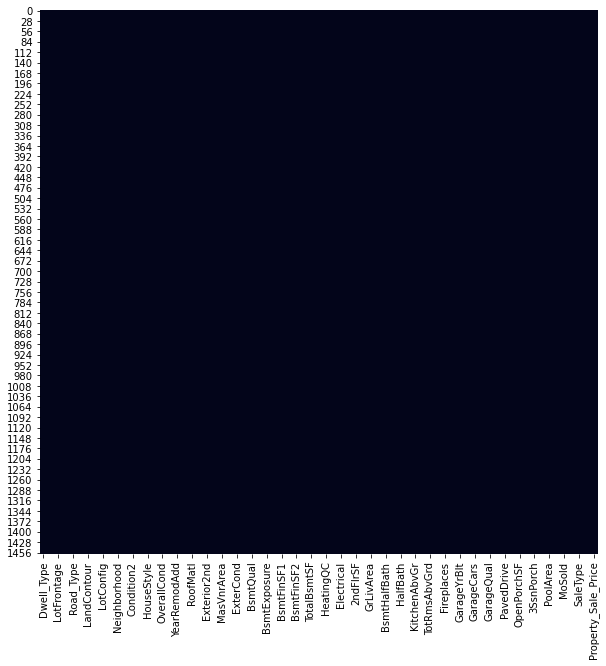

In [45]:
sns.heatmap(data_copy.isnull(), cbar = False)


# OUTLIERS

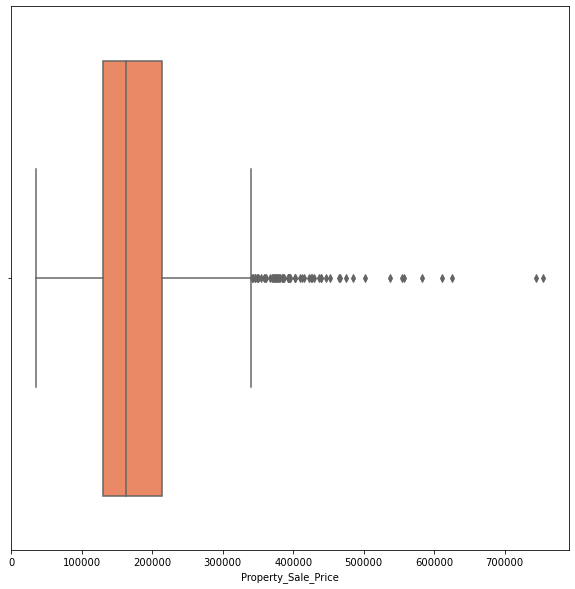

In [46]:
sns.boxplot(data_copy['Property_Sale_Price'], color = 'coral')

In [47]:
data_copy = data_copy[data_copy['Property_Sale_Price']<500000]
data_copy.shape

(1451, 75)

In [48]:
plt.rcParams['figure.figsize'] = [20,20]

In [1]:
sns.heatmap(data_copy.corr(), cbar = False, annot = True)

NameError: name 'sns' is not defined


# normality



In [50]:
plt.rcParams['figure.figsize'] = [10,5]

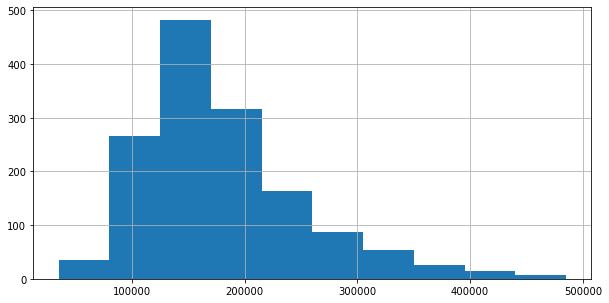

In [51]:
dep_var_bef_plt = data_copy['Property_Sale_Price'].hist()

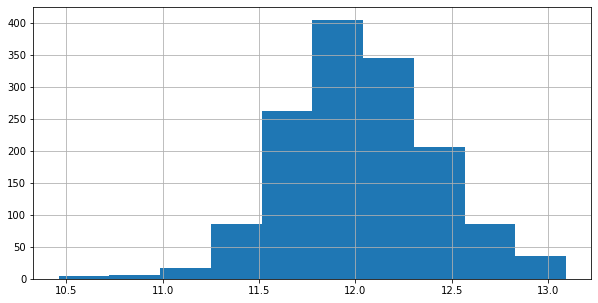

In [52]:
data_copy['log_Property_Sale_Price'] = np.log(data_copy['Property_Sale_Price'])
dep_var_aftr_plt = data_copy['log_Property_Sale_Price'].hist()

In [53]:
dep_var_aftr_skew = data_copy['log_Property_Sale_Price'].skew()
dep_var_bef_skew  = data_copy['Property_Sale_Price'].skew()
print('dep_var_aftr_skew',dep_var_aftr_skew)
print('dep_var_bef_skew',dep_var_bef_skew)

dep_var_aftr_skew -0.03836503763294778
dep_var_bef_skew 1.2080022811555442


In [54]:
data_copy.shape

(1451, 76)

In [55]:
data_act = data_copy.copy()
data_f3 = data_copy.copy()

# ENCODING

In [56]:
num_data = data_copy.select_dtypes(include = np.number)
str_data = data_copy.select_dtypes(include = object)

In [57]:
dummy_variables = pd.get_dummies(str_data, drop_first = True)

In [58]:
data_dummy = pd.concat([num_data,dummy_variables], axis = 1)

In [59]:
data_dummy.shape

(1451, 272)

In [61]:
data_dummy.to_csv('linear.csv')

# MODEL -1 , model_with_log

In [32]:
num_data_1 = num_data
str_data_1 = str_data
dummy_variables_1 = dummy_variables
data_dummy_1 = data_dummy

In [33]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

In [34]:
data_dummy_1 = sm.add_constant(data_dummy)

In [35]:
x_1 = data_dummy_1.drop(['Property_Sale_Price','log_Property_Sale_Price'], axis = 1)
y_1 = data_dummy_1[['Property_Sale_Price','log_Property_Sale_Price']]

In [36]:
x1_train,x1_test,y1_train,y1_test = train_test_split(x_1,y_1, test_size = 0.3, random_state = 1)
print(x1_train.shape)
print(y1_train.shape)
print(x1_test.shape)
print(y1_test.shape)

(1015, 271)
(1015, 2)
(436, 271)
(436, 2)


In [37]:
LR_MODEL_WITH_LOG = sm.OLS(y1_train['log_Property_Sale_Price'], x1_train).fit()
summary = LR_MODEL_WITH_LOG.summary()

In [38]:
summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     log_Property_Sale_Price   R-squared:                       0.951
Model:                                 OLS   Adj. R-squared:                  0.935
Method:                      Least Squares   F-statistic:                     59.56
Date:                     Fri, 26 Mar 2021   Prob (F-statistic):               0.00
Time:                             15:02:40   Log-Likelihood:                 1080.0
No. Observations:                     1015   AIC:                            -1658.
Df Residuals:                          764   BIC:                            -422.3
Df Model:                              250                                         
Covariance Type:                 nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     6.3129      4.059      1.555      0.120      -1.656      14.282
LotFrontage               0.0003      0.000      1.176      0.240      -0.000       0.001
LotArea                3.257e-06   5.81e-07      5.609      0.000    2.12e-06     4.4e-06
YearBuilt                 0.0019      0.000      4.234      0.000       0.001       0.003
YearRemodAdd              0.0010      0.000      3.536      0.000       0.000       0.002
MasVnrArea             2.132e-05   3.26e-05      0.653      0.514   -4.27e-05    8.54e-05
BsmtFinSF1             5.795e-05   1.58e-05      3.675      0.000     2.7e-05    8.89e-05
BsmtFinSF2             2.999e-05    3.1e-05      0.967      0.334   -3.09e-05    9.09e-05
BsmtUnfSF             -3.452e-06   1.48e-05     -0.233      0.815   -3.25e-05    2.56e-05
TotalBsmtSF             8.45e-05    2.2e-05      3.840      0.000    4.13e-05       0.000
1stFlrSF                  0.0001    3.5e-05      2.925      0.004    3.37e-05       0.000
2ndFlrSF                8.25e-05   3.19e-05      2.590      0.010       2e-05       0.000
LowQualFinSF          -3.492e-05   7.75e-05     -0.451      0.652      -0.000       0.000
GrLivArea                 0.0001   3.06e-05      4.906      0.000       9e-05       0.000
BsmtFullBath              0.0232      0.011      2.191      0.029       0.002       0.044
BsmtHalfBath              0.0228      0.016      1.466      0.143      -0.008       0.053
FullBath                  0.0156      0.012      1.276      0.203      -0.008       0.040
HalfBath                  0.0156      0.011      1.427      0.154      -0.006       0.037
BedroomAbvGr              0.0162      0.008      2.105      0.036       0.001       0.031
KitchenAbvGr             -0.0438      0.037     -1.172      0.242      -0.117       0.030
TotRmsAbvGrd             -0.0034      0.005     -0.662      0.508      -0.013       0.007
Fireplaces                0.0260      0.007      3.662      0.000       0.012       0.040
GarageYrBlt            6.551e-05      0.000      0.199      0.843      -0.001       0.001
GarageCars                0.0358      0.012      2.924      0.004       0.012       0.060
GarageArea             7.552e-05   4.38e-05      1.723      0.085   -1.05e-05       0.000
WoodDeckSF             5.868e-05   3.26e-05      1.798      0.072   -5.37e-06       0.000
OpenPorchSF               0.0002   6.25e-05      2.406      0.016    2.76e-05       0.000
EnclosedPorch             0.0002   7.25e-05      2.288      0.022    2.35e-05       0.000
3SsnPorch                 0.0003      0.000      2.026      0.043    8.55e-06       0.001
ScreenPorch               0.0002   6.87e-05      2.934      0.003    6.67e-05       0.000
PoolArea                  0.0001   8.93e-05      1.468    

In [39]:
y_predicts_with_log1 = LR_MODEL_WITH_LOG.predict(x1_test)
y_predict1 = np.exp(y_predicts_with_log1)
y_actual1 = y1_test['Property_Sale_Price']

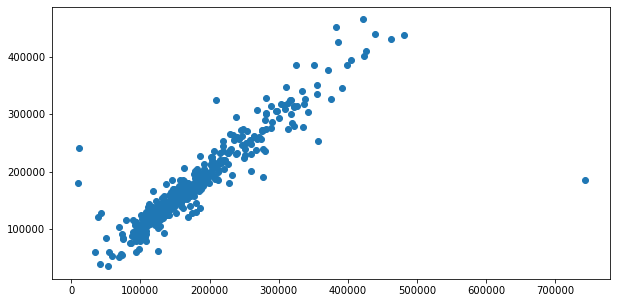

In [40]:
scatter_plt_btwen_actual_nd_predicted = plt.scatter(y_predict1,y_actual1)

In [41]:
R2_SCORE = LR_MODEL_WITH_LOG.rsquared
ADJ_SCORE = LR_MODEL_WITH_LOG.rsquared_adj
AIC = LR_MODEL_WITH_LOG.aic
BIC = LR_MODEL_WITH_LOG.bic

In [42]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

In [43]:
from statsmodels.tools.eval_measures import rmse
RMSE = rmse(y_actual1,y_predict1)
MAE = mean_absolute_error(y_actual1,y_predict1)


In [44]:
MODEL1 = pd.DataFrame({'MODELS':['LR_MODEL_WITH_LOG'],
                       'RMSE':[RMSE],
                       'MAE': [MAE],
                       'AIC':[AIC],
                       'BIC':[BIC],
                       'R2_SCORE': [R2_SCORE],
                       'ADJ_SCORE': [ADJ_SCORE]})

In [45]:
MODEL1

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221






# MODEL 2:- LR_WITH_OUT_LOG

In [46]:
num_data_2 = num_data
str_data_2 = str_data
dummy_variables_2 = dummy_variables
data_dummy_2 = data_dummy

In [47]:
data_dummy_2 = sm.add_constant(data_dummy_2)

In [48]:
x_2 = data_dummy_2.drop(['Property_Sale_Price','log_Property_Sale_Price'], axis = 1)
y_2 = data_dummy_2[['Property_Sale_Price']]

In [49]:
x2_train,x2_test,y2_train,y2_test = train_test_split(x_2,y_2 , test_size = 0.3, random_state = 1)

In [50]:
print(x2_train.shape)
print(x2_test.shape)
print(y2_train.shape)
print(y2_test.shape)

(1015, 271)
(436, 271)
(1015, 1)
(436, 1)


In [53]:
LR_MODEL_WITH_OUT_LOG = sm.OLS(y2_train,x2_train).fit()
print(LR_MODEL_WITH_OUT_LOG.summary())

                             OLS Regression Results                            
Dep. Variable:     Property_Sale_Price   R-squared:                       0.946
Model:                             OLS   Adj. R-squared:                  0.929
Method:                  Least Squares   F-statistic:                     54.04
Date:                 Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                         21:58:20   Log-Likelihood:                -11285.
No. Observations:                 1015   AIC:                         2.307e+04
Df Residuals:                      764   BIC:                         2.431e+04
Df Model:                          250                                         
Covariance Type:             nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const               

In [54]:
y_predict2 = LR_MODEL_WITH_OUT_LOG.predict(x2_test)
y_actual2 = y2_test['Property_Sale_Price']

In [55]:
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

In [56]:
R2_SCORE = LR_MODEL_WITH_OUT_LOG.rsquared
ADJ_SCORE = LR_MODEL_WITH_OUT_LOG.rsquared_adj
AIC = LR_MODEL_WITH_OUT_LOG.aic
BIC = LR_MODEL_WITH_OUT_LOG.bic


In [57]:
RMSE = rmse(y_predict2,y_actual2)
MAE = mean_absolute_error(y_predict2,y_actual2)

In [58]:
MODEL2 = pd.DataFrame({'MODELS':['LR_MODEL_WITH_OUT_LOG'],
                       'RMSE':[rmse(y_predict2,y_actual2)],
                       'MAE':[mean_absolute_error(y_predict2,y_actual2)],
                       'AIC':[LR_MODEL_WITH_OUT_LOG.aic],
                       'BIC':[LR_MODEL_WITH_OUT_LOG.bic],
                       'R2_SCORE':[LR_MODEL_WITH_OUT_LOG.rsquared],
                       'ADJ_SCORE':[LR_MODEL_WITH_OUT_LOG.rsquared_adj]})

In [59]:
col = ['MODELS','RMSE','MAE','AIC','BIC','R2_SCORE','ADJ_SCORE']
result = pd.DataFrame(columns=col)
result = result.append(MODEL1, ignore_index = True)
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221


In [60]:
result = result.append(MODEL2, ignore_index = True)
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958


# model3: FEATURE ENGINEERING

In [61]:
data_copy.shape

(1451, 76)

In [62]:
data_act.shape

(1451, 76)

In [63]:
data_act['TotalSF'] = data_act['TotalBsmtSF'] + data_act['1stFlrSF'] + data_act['2ndFlrSF'] + data_act['GrLivArea']

In [64]:
data_act = data_act.drop(['TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea'], axis = 1)
print(data_act.shape)

(1451, 73)


In [65]:
num_data_3 = data_act.select_dtypes(include = np.number)
str_data_3 = data_act.select_dtypes(include = object)

In [66]:
print(str_data_3.shape)
print(num_data_3.shape)

(1451, 41)
(1451, 32)


In [67]:
dummy_variables_3 = pd.get_dummies(str_data_3, drop_first = True)

In [68]:
dummy_data_3 = pd.concat([num_data_3, dummy_variables_3], axis = 1)


In [69]:
dummy_data_3.isnull().sum()

LotFrontage                0
LotArea                    0
YearBuilt                  0
YearRemodAdd               0
MasVnrArea                 0
BsmtFinSF1                 0
BsmtFinSF2                 0
BsmtUnfSF                  0
LowQualFinSF               0
BsmtFullBath               0
BsmtHalfBath               0
FullBath                   0
HalfBath                   0
BedroomAbvGr               0
KitchenAbvGr               0
TotRmsAbvGrd               0
Fireplaces                 0
GarageYrBlt                0
GarageCars                 0
GarageArea                 0
WoodDeckSF                 0
OpenPorchSF                0
EnclosedPorch              0
3SsnPorch                  0
ScreenPorch                0
PoolArea                   0
MiscVal                    0
MoSold                     0
YrSold                     0
Property_Sale_Price        0
log_Property_Sale_Price    0
TotalSF                    0
Dwell_Type_30              0
Dwell_Type_40              0
Dwell_Type_45 

In [70]:
dummy_data_3 = sm.add_constant(dummy_data_3)

In [71]:
x_3 = dummy_data_3.drop(['Property_Sale_Price','log_Property_Sale_Price'], axis = 1)

In [72]:
y_3 = dummy_data_3[['Property_Sale_Price','log_Property_Sale_Price']]

In [73]:
x3_train,x3_test,y3_train,y3_test = train_test_split(x_3,y_3, test_size = 0.3, random_state = 1)

In [74]:
print(x3_train.shape)
print(x3_test.shape)
print(y3_train.shape)
print(y3_test.shape)

(1015, 268)
(436, 268)
(1015, 2)
(436, 2)


In [75]:
LR_MODEL_with_FEATURE1 = sm.OLS(y3_train['log_Property_Sale_Price'], x3_train).fit()
print(LR_MODEL_with_FEATURE1.summary())

                               OLS Regression Results                              
Dep. Variable:     log_Property_Sale_Price   R-squared:                       0.951
Model:                                 OLS   Adj. R-squared:                  0.935
Method:                      Least Squares   F-statistic:                     59.85
Date:                     Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                             21:58:27   Log-Likelihood:                 1079.8
No. Observations:                     1015   AIC:                            -1660.
Df Residuals:                          765   BIC:                            -428.9
Df Model:                              249                                         
Covariance Type:                 nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [76]:
y_predict3_log = LR_MODEL_with_FEATURE1.predict(x3_test)
y_predict3 = np.exp(y_predict3_log)
y_actual3 = y3_test['Property_Sale_Price']

In [77]:
R2_SCORE = LR_MODEL_with_FEATURE1.rsquared
ADJ_SCORE = LR_MODEL_with_FEATURE1.rsquared_adj
AIC = LR_MODEL_with_FEATURE1.aic
BIC = LR_MODEL_with_FEATURE1.bic

In [78]:
from statsmodels.tools.eval_measures import rmse

In [79]:
RMSE = rmse(y_actual3,y_predict3)
MAE = mean_absolute_error(y_actual3,y_predict3)

In [80]:
MODEL3 = pd.DataFrame({'MODELS':['LR_MODEL_WITH_FEATURE1'],
                       'RMSE':[RMSE],
                       'MAE':[MAE],
                       'AIC':[AIC],
                       'BIC':[BIC],
                        'R2_SCORE':[R2_SCORE],
                        'ADJ_SCORE':[ADJ_SCORE]})

In [81]:
result = result.append(MODEL3, ignore_index = True)

In [82]:
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958
2,LR_MODEL_WITH_FEATURE1,36541.153036,16211.680283,-1659.575689,-428.914716,0.951177,0.935285


# MODEL-4: USING NEW FEATURE2

In [83]:
data_f2 = data_act

In [84]:
import datetime as dt
curr_year = int(dt.datetime.now().year)
yearbuiltage = curr_year - data_f2['YearBuilt']
Remodel_age = curr_year - data_f2['YearRemodAdd']
data_f2['yearbuiltage'] = yearbuiltage
data_f2['Remodel_age'] = Remodel_age

In [85]:
data_f2 = data_f2.drop(['YearBuilt','YearRemodAdd'], axis = 1)

In [86]:
num_data_f2 = data_f2.select_dtypes(include = np.number)
str_data_f2 = data_f2.select_dtypes(include = object)

In [87]:
dummy_variable_4 = pd.get_dummies(str_data_f2, drop_first = True)
dummy_data_4 = pd.concat([num_data_f2,dummy_variable_4], axis = 1)

In [88]:
dummy_data_4 = sm.add_constant(dummy_data_4)
x_4 = dummy_data_4.drop(['Property_Sale_Price','log_Property_Sale_Price'], axis = 1)
y_4 = dummy_data_4[['Property_Sale_Price','log_Property_Sale_Price']]

In [89]:
x4_train,x4_test,y4_train,y4_test = train_test_split(x_4,y_4, test_size = 0.3,random_state = 1)

In [90]:
print(x4_train.shape)
print(x4_test.shape)
print(y4_train.shape)
print(y4_test.shape)

(1015, 268)
(436, 268)
(1015, 2)
(436, 2)


In [91]:
LR_MODEL_WITH_F2 = sm.OLS(y4_train['log_Property_Sale_Price'], x4_train).fit()
print(LR_MODEL_WITH_F2.summary())

                               OLS Regression Results                              
Dep. Variable:     log_Property_Sale_Price   R-squared:                       0.951
Model:                                 OLS   Adj. R-squared:                  0.935
Method:                      Least Squares   F-statistic:                     59.85
Date:                     Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                             21:58:33   Log-Likelihood:                 1079.8
No. Observations:                     1015   AIC:                            -1660.
Df Residuals:                          765   BIC:                            -428.9
Df Model:                              249                                         
Covariance Type:                 nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [92]:
y_predict_log_4 = LR_MODEL_WITH_F2.predict(x4_test)
y_predict4 = np.exp(y_predict_log_4)
y_actual4 = y4_test['Property_Sale_Price']

In [93]:
R2_SCORE = LR_MODEL_WITH_F2.rsquared
ADJ_SCORE = LR_MODEL_WITH_F2.rsquared_adj
AIC = LR_MODEL_WITH_F2.aic
BIC = LR_MODEL_WITH_F2.bic

In [94]:
from statsmodels.tools.eval_measures import rmse

In [95]:
RMSE = rmse(y_actual4,y_predict4)
MAE = mean_absolute_error(y_actual4,y_predict4)

In [96]:
MODEL4 = pd.DataFrame({'MODELS':['LR_MODEL_WITH_F2'],
                       'RMSE':[RMSE],
                       'MAE':[MAE],
                       'AIC':[AIC],
                       'BIC':[BIC],
                      'R2_SCORE':[R2_SCORE],
                      'ADJ_SCORE':[ADJ_SCORE]})

In [97]:
result = result.append(MODEL4, ignore_index= True)
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958
2,LR_MODEL_WITH_FEATURE1,36541.153036,16211.680283,-1659.575689,-428.914716,0.951177,0.935285
3,LR_MODEL_WITH_F2,36851.018305,16345.213655,-1659.575689,-428.914716,0.951177,0.935285


# MODEL-5 variance_inflacation_factor

In [98]:
data_vif = data_act.copy()
data_ind = data_vif.drop(['Property_Sale_Price', 'log_Property_Sale_Price'], axis = 1)


In [99]:
num_data_5 = data_ind.select_dtypes(include = np.number)
num_data_5.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,yearbuiltage,Remodel_age
0,65.0,8450,2003,2003,196.0,706,0,150,0,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,4276,18,18
1,80.0,9600,1976,1976,0.0,978,0,284,0,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,3786,45,45
2,68.0,11250,2001,2002,162.0,486,0,434,0,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,4492,20,19
3,60.0,9550,1915,1970,0.0,216,0,540,0,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,4190,106,51
4,84.0,14260,2000,2000,350.0,655,0,490,0,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,5541,21,21


In [100]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [101]:
vif = pd.DataFrame()
vif["VIF_Factor"] = [variance_inflation_factor(num_data_5.values, i) for i in range(num_data_5.shape[1])]
vif["Features"] = num_data_5.columns
vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True).head()

C:\Users\HARI KRISHNA\anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:193: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


,VIF_Factor,Features
0,inf,Remodel_age
1,inf,YearBuilt
2,inf,YearRemodAdd
3,inf,yearbuiltage
4,10.019792,TotalSF


In [102]:
vif = vif[vif['VIF_Factor']< 10]
l = []
for i in vif['Features']:
    l.append(i)
num_data_vif = num_data_5[l]

In [103]:
dummy_data_5 = pd.concat([num_data_vif,dummy_variables], axis = 1)

In [104]:
dummy_data_5.shape

(1451, 264)

In [105]:
dummy_data_5 = sm.add_constant(dummy_data_5)

In [106]:
x_5 = dummy_data_5.copy()
y_5 = data_vif[['Property_Sale_Price','log_Property_Sale_Price']]

In [107]:
x5_train,x5_test,y5_train,y5_test = train_test_split(x_5,y_5, test_size = 0.3, random_state = 1)

In [108]:
print(x5_train.shape)
print(x5_test.shape)
print(y5_train.shape)
print(y5_test.shape)

(1015, 265)
(436, 265)
(1015, 2)
(436, 2)


In [109]:
LR_MODEL_WITH_VIF = sm.OLS(y5_train['log_Property_Sale_Price'], x5_train).fit()
print(LR_MODEL_WITH_VIF.summary())

                               OLS Regression Results                              
Dep. Variable:     log_Property_Sale_Price   R-squared:                       0.942
Model:                                 OLS   Adj. R-squared:                  0.924
Method:                      Least Squares   F-statistic:                     51.13
Date:                     Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                             21:58:43   Log-Likelihood:                 996.34
No. Observations:                     1015   AIC:                            -1499.
Df Residuals:                          768   BIC:                            -282.8
Df Model:                              246                                         
Covariance Type:                 nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [110]:
y_predict_log_5 = LR_MODEL_WITH_VIF.predict(x5_test)

In [111]:
y_predict5 = np.exp(y_predict_log_5)
y_actual5 = y5_test['Property_Sale_Price']

In [112]:
R2_SCORE = LR_MODEL_WITH_VIF.rsquared
ADJ_SCORE = LR_MODEL_WITH_VIF.rsquared_adj
AIC = LR_MODEL_WITH_VIF.aic
BIC = LR_MODEL_WITH_VIF.bic

In [113]:
from statsmodels.tools.eval_measures import rmse

In [114]:
RMSE = rmse(y_actual5,y_predict5)
MAE = mean_absolute_error(y_actual5,y_predict5)

In [115]:
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958
2,LR_MODEL_WITH_FEATURE1,36541.153036,16211.680283,-1659.575689,-428.914716,0.951177,0.935285
3,LR_MODEL_WITH_F2,36851.018305,16345.213655,-1659.575689,-428.914716,0.951177,0.935285


In [116]:
from statsmodels.tools.eval_measures import rmse

In [117]:
MODEL5 = pd.DataFrame({'MODELS':['LR_MODEL_WITH_VIF'],
                       'RMSE':[RMSE],
                       'MAE':[MAE],
                       'AIC':[AIC],
                      'BIC':[BIC],
                      'R2_SCORE':[R2_SCORE],
                      'ADJ_SCORE':[ADJ_SCORE]})

In [118]:
result = result.append(MODEL5, ignore_index=True)
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958
2,LR_MODEL_WITH_FEATURE1,36541.153036,16211.680283,-1659.575689,-428.914716,0.951177,0.935285
3,LR_MODEL_WITH_F2,36851.018305,16345.213655,-1659.575689,-428.914716,0.951177,0.935285
4,LR_MODEL_WITH_VIF,31506.197694,17411.716560,-1498.673497,-282.780455,0.942450,0.924017


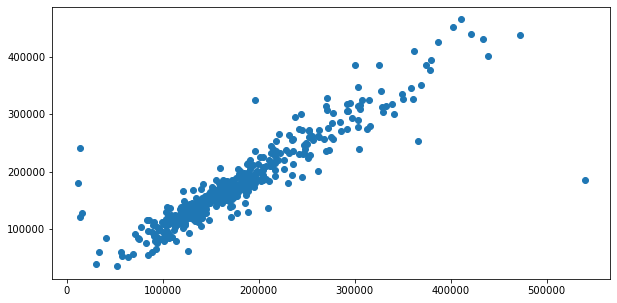

In [119]:
plt.scatter(y_predict5,y_actual5)

#  MODEL-6 Linreg with Forward Selection

In [120]:
data_for =  data_act

In [121]:
data_num_6= data_for.select_dtypes(include = np.number)
str_num_6 = data_for.select_dtypes(include = object)

In [122]:
data_dummies_for = pd.get_dummies(str_num_6, drop_first= True)

In [123]:
dummy_data_6 = pd.concat([data_num_6,data_dummies_for], axis = 1)


In [124]:
dummy_data_6 = sm.add_constant(dummy_data_6)

In [125]:
x_6 = dummy_data_6.drop(['Property_Sale_Price','log_Property_Sale_Price'], axis = 1)
y_6 = dummy_data_6[['Property_Sale_Price','log_Property_Sale_Price']]

In [126]:
x6_train,x6_test,y6_train,y6_test = train_test_split(x_6,y_6 ,test_size = 0.3, random_state = 1)

In [127]:
print(x6_train.shape)
print(x6_test.shape)
print(y6_train.shape)
print(y6_test.shape)

(1015, 270)
(436, 270)
(1015, 2)
(436, 2)


In [128]:
from sklearn.linear_model import LinearRegression
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

In [129]:
linear = LinearRegression()

In [130]:
linear_forward = sfs(estimator = linear, k_features= 'best', forward= True, verbose = 2, scoring = 'r2', n_jobs = -1)

In [131]:
sfs_forward = linear_forward.fit(x6_train,y6_train['log_Property_Sale_Price'])

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done 270 out of 270 | elapsed:    5.5s finished

[2021-03-05 21:59:03] Features: 1/270 -- score: 0.5365823363715579[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 269 out of 269 | elapsed:    0.9s finished

[2021-03-05 21:59:04] Features: 2/270 -- score: 0.6897947555598851[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 268 out of 268 | elapsed:    1.0s finished

[2021-03-05 21:59:05] Features: 3/270 -- score: 0.7171443924086847[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 267 ou

In [132]:
print('no of features selected using forward method', len(sfs_forward.k_feature_names_))

print('\n')

selc_data = sfs_forward.k_feature_names_

a = list(selc_data)

no of features selected using forward method 87




In [133]:
l = []
for i in data_act.columns:
    l.append(i)
len(l)

75

In [134]:
sel = ['const','YearBuilt','YearRemodAdd','GrLivArea','BsmtFullBath','FullBath','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','WoodDeckSF','OpenPorchSF','EnclosedPorch','ScreenPorch','Dwell_Type','Zone_Class','Property_Shape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','HouseStyle','OverallQual','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC','CentralAir','Electrical','Functional','GarageType','GarageFinish','GarageQual','SaleType','SaleCondition']
len(sel)

46

In [135]:
da = []
for i in l:
    for j in sel:
        if i == j:
            da.append(i)

In [136]:
data_forward = data_act[da]
data_forward.shape

(1451, 44)

In [137]:
data_num6 = data_forward.select_dtypes(include = np.number)
str_num6 = data_forward.select_dtypes(include = object)
str_num6.shape

(1451, 32)

In [138]:
data_num6.shape

(1451, 12)

In [139]:
str_dummy = pd.get_dummies(str_num6, drop_first= True)
str_dummy.shape

(1451, 199)

In [140]:
data_total = pd.concat([data_num6,str_dummy], axis = 1)

In [141]:
data_total.shape

(1451, 211)

In [142]:
data_total = sm.add_constant(data_total)

In [143]:
data_total.shape

(1451, 212)

In [144]:
y = data_for[['Property_Sale_Price','log_Property_Sale_Price']]

In [145]:
x_train, x_test, y_train, y_test = train_test_split(data_total, y, test_size = 0.3, random_state = 1)


In [146]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(1015, 212)
(436, 212)
(1015, 2)
(436, 2)


In [147]:
LR_MODEL_WITH_FORWARD = sm.OLS(y_train['log_Property_Sale_Price'], x_train).fit()
print(LR_MODEL_WITH_FORWARD.summary())

                               OLS Regression Results                              
Dep. Variable:     log_Property_Sale_Price   R-squared:                       0.921
Model:                                 OLS   Adj. R-squared:                  0.901
Method:                      Least Squares   F-statistic:                     47.24
Date:                     Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                             22:12:04   Log-Likelihood:                 833.47
No. Observations:                     1015   AIC:                            -1265.
Df Residuals:                          814   BIC:                            -275.5
Df Model:                              200                                         
Covariance Type:                 nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [148]:
y_predict_log6 = LR_MODEL_WITH_FORWARD.predict(x_test)

In [149]:
y_predict6 = np.exp(y_predict_log6)

In [150]:
y_actual6 = y_test['Property_Sale_Price']

In [151]:
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [152]:
rmse = rmse(y_actual6, y_predict6)
rmse

29898.72725720812

In [153]:
mae = mean_absolute_error(y_actual6, y_predict6)

In [154]:
r2_score = LR_MODEL_WITH_FORWARD.rsquared

In [155]:
r2_adj = LR_MODEL_WITH_FORWARD.rsquared_adj
AIC = LR_MODEL_WITH_FORWARD.aic
BIC = LR_MODEL_WITH_FORWARD.bic

In [156]:
MODEL6 = pd.DataFrame({'MODELS': ["LR_MODEL_WITH_FORWARD"],
                                                'RMSE': [rmse],
                                               'MAE':[mae],
                                               'AIC':[AIC],
                                               'BIC':[BIC],
                                                'R2_SCORE': [r2_score],
                                                'ADJ_SCORE': [r2_adj]})
MODEL6

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_FORWARD,29898.727257,18889.513038,-1264.936212,-275.48479,0.920674,0.901183


In [157]:
result = result.append(MODEL6, ignore_index= True)
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958
2,LR_MODEL_WITH_FEATURE1,36541.153036,16211.680283,-1659.575689,-428.914716,0.951177,0.935285
3,LR_MODEL_WITH_F2,36851.018305,16345.213655,-1659.575689,-428.914716,0.951177,0.935285
4,LR_MODEL_WITH_VIF,31506.197694,17411.716560,-1498.673497,-282.780455,0.942450,0.924017
5,LR_MODEL_WITH_FORWARD,29898.727257,18889.513038,-1264.936212,-275.484790,0.920674,0.901183


# MODEL-7 BACKWARD ELIMINATION

In [158]:
data_back =  data_act

In [159]:
num_data7 = data_back.select_dtypes(include = np.number)
str_data7 = data_back.select_dtypes(include = object)

In [160]:
print(num_data7.shape)
print(str_data7.shape)

(1451, 34)
(1451, 41)


In [161]:
str_dummy = pd.get_dummies(str_data7, drop_first = True)
print(str_dummy.shape)

(1451, 237)


In [162]:
data_dummy = pd.concat([num_data7,str_dummy], axis = 1)

In [163]:
data_dummy.shape

(1451, 271)

In [164]:
data_dummy = sm.add_constant(data_dummy)

In [165]:
x = data_dummy.drop(['Property_Sale_Price','log_Property_Sale_Price'], axis = 1)
y = data_dummy[['Property_Sale_Price','log_Property_Sale_Price']]

In [166]:
x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.3, random_state = 1)

In [167]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(1015, 270)
(1015, 2)
(436, 270)
(436, 2)


In [168]:
LR_MODEL = LinearRegression()

In [169]:
linear_background = sfs(estimator=LR_MODEL, k_features = 'best', forward = False, verbose = 2,scoring = 'r2',n_jobs = -1)

In [170]:
sfs_background = linear_background.fit(x_train,y_train['log_Property_Sale_Price'])

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 270 out of 270 | elapsed:   16.6s finished

[2021-03-05 22:12:40] Features: 269/1 -- score: 0.7827023086891034[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 269 out of 269 | elapsed:   18.2s finished

[2021-03-05 22:12:58] Features: 268/1 -- score: 0.7880033335987442[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 268 out of 268 | elapsed:   15.7s finished

[2021-03-05 22:13:15] Features: 267/1 -- score: 0.79

In [171]:
print('mo of features selected :', len(sfs_background.k_feature_names_))

print('\n')

print(sfs_background.k_feature_names_)

mo of features selected : 115


('LotArea', 'YearRemodAdd', 'LowQualFinSF', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'YrSold', 'Dwell_Type_30', 'Dwell_Type_60', 'Dwell_Type_85', 'Dwell_Type_120', 'Dwell_Type_160', 'Dwell_Type_180', 'Zone_Class_FV', 'Zone_Class_RH', 'Zone_Class_RL', 'Zone_Class_RM', 'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LandSlope_Mod', 'Neighborhood_CollgCr', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_StoneBr', 'Neighborhood_Timber', 'Condition1_Norm', 'Condition1_PosN', 'Condition1_RRNn', 'Condition2_Norm', 'Dw

In [172]:
BACK = ['YearRemodAdd','BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd','Fireplaces', 'GarageCars', 'WoodDeckSF','OpenPrhSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'YrSold', 
'TotalSF', 
'Dwell_Type',
'Zone_Class',
 'Property_Shape',
 'LandContour',
'Utilities', 
'LotConfig', 
'Neighborhood','Condition1', 'Dwelling_Type','HouseStyle','OverallQual','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','ExterQual','BsmtCond', 'BsmtExposure','BsmtFinType1','Heating','CentralAir', 'Electrical','KitchenQual', 'Functional','GarageType','GarageQual', 'GarageCond', 'SaleType','SaleCondition']

In [173]:
len(BACK)

46

In [174]:
len(data_back.columns)

75

In [175]:
k = []
for i in BACK:
    for j in data_back.columns:
        if i == j:
            k.append(i)

In [176]:
data_back = data_back[k]

In [177]:
num_data6 = data_back.select_dtypes(include = np.number)
str_data6 = data_back.select_dtypes(include = object)


In [178]:
str_dummy_var = pd.get_dummies(str_data6, drop_first=True)
str_dummy_var.shape

(1451, 191)

In [179]:
dummy_data6 = pd.concat([num_data6,str_dummy_var], axis = 1)
y = data_act[['Property_Sale_Price','log_Property_Sale_Price']]

In [180]:
X_train, X_test, y_train, y_test = train_test_split(dummy_data6, y, test_size = 0.3, random_state = 1)


In [181]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(1015, 270)
(436, 270)
(1015, 2)
(436, 2)


In [182]:
LR_MODEL_BACK = sm.OLS(y_train['log_Property_Sale_Price'],x_train).fit()
print(LR_MODEL_BACK.summary())

                               OLS Regression Results                              
Dep. Variable:     log_Property_Sale_Price   R-squared:                       0.951
Model:                                 OLS   Adj. R-squared:                  0.935
Method:                      Least Squares   F-statistic:                     59.85
Date:                     Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                             22:38:46   Log-Likelihood:                 1079.8
No. Observations:                     1015   AIC:                            -1660.
Df Residuals:                          765   BIC:                            -428.9
Df Model:                              249                                         
Covariance Type:                 nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [183]:
y_predict_log6 = LR_MODEL_BACK.predict(x_test)
y_predict6 = np.exp(y_predict_log6)
y_actual6 = y_test['Property_Sale_Price']

In [184]:
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [185]:
rmse = rmse(y_actual6,y_predict6)
mae = mean_absolute_error(y_actual6,y_predict6)

In [186]:
rsquare = LR_MODEL_BACK.rsquared
adj = LR_MODEL_BACK.rsquared_adj
AIC = LR_MODEL_BACK.aic
BIC = LR_MODEL_BACK.bic

In [187]:
model7 = pd.DataFrame({'MODELS':['LR_MODEL_BACK'],
                       'RMSE':[rmse],
                      'MAE':[mae],
                      'AIC':[AIC],
                      'BIC':[BIC],
                      'R2_SCORE':[rsquare],
                      'ADJ_SCORE':[adj]})

In [188]:
model7

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_BACK,36305.489395,16132.27734,-1659.575689,-428.914716,0.951177,0.935285


In [189]:
result = result.append(model7)

In [190]:
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958
2,LR_MODEL_WITH_FEATURE1,36541.153036,16211.680283,-1659.575689,-428.914716,0.951177,0.935285
3,LR_MODEL_WITH_F2,36851.018305,16345.213655,-1659.575689,-428.914716,0.951177,0.935285
4,LR_MODEL_WITH_VIF,31506.197694,17411.716560,-1498.673497,-282.780455,0.942450,0.924017
5,LR_MODEL_WITH_FORWARD,29898.727257,18889.513038,-1264.936212,-275.484790,0.920674,0.901183
0,LR_MODEL_BACK,36305.489395,16132.277340,-1659.575689,-428.914716,0.951177,0.935285


# MODEL- 8 recursive feature elimination

In [191]:
num_data_8 = data_act.select_dtypes(include = np.number)
str_data_8 = data_act.select_dtypes(include = object)

In [192]:
dummy_variables = pd.get_dummies(str_data_8,drop_first= True)

In [193]:
data_dummy_8 = pd.concat([dummy_variables,num_data],axis = 1)

In [194]:
data_dummy_8.head()

,Dwell_Type_30,Dwell_Type_40,Dwell_Type_45,Dwell_Type_50,Dwell_Type_60,Dwell_Type_70,Dwell_Type_75,Dwell_Type_80,Dwell_Type_85,Dwell_Type_90,Dwell_Type_120,Dwell_Type_160,Dwell_Type_180,Dwell_Type_190,Zone_Class_FV,Zone_Class_RH,Zone_Class_RL,Zone_Class_RM,Road_Type_Pave,Property_Shape_IR2,Property_Shape_IR3,Property_Shape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,Dwelling_Type_2fmCon,Dwelling_Type_Duplex,Dwelling_Type_Twnhs,Dwelling_Type_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_2,OverallQual_3,OverallQual_4,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_9,OverallQual_10,OverallCond_2,OverallCond_3,OverallCond_4,OverallCond_5,OverallCond_6,OverallCond_7,OverallCond_8,OverallCond_9,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_none,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtCond_none,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_none,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_none,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_none,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Electrical_none,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_none,GarageFinish_RFn,GarageFinish_Unf,GarageFinish_none,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageQual_none,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,GarageCond_none,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFi

In [195]:
import statsmodels.api as sm
data_dummy_8 = sm.add_constant(data_dummy_8)

In [196]:
from sklearn.model_selection import train_test_split

In [197]:
x_8 = data_dummy_8.drop(['Property_Sale_Price','log_Property_Sale_Price'], axis = 1)
y_8 = data_dummy_8[['Property_Sale_Price','log_Property_Sale_Price']]
x8_train,x8_test,y8_train,y8_test = train_test_split(x_8,y_8, test_size = 0.3, random_state = 1)
print(x8_train.shape)
print(x8_test.shape)
print(y8_train.shape)
print(y8_test.shape)

(1015, 271)
(436, 271)
(1015, 2)
(436, 2)


In [198]:
linear = LinearRegression()
from sklearn.feature_selection import RFE
rfe_model = RFE(estimator = linear)

In [199]:
rfe_model = rfe_model.fit(x8_train,y8_train['log_Property_Sale_Price'])

In [200]:
feat_index = pd.Series(data = rfe_model.ranking_, index = x8_train.columns)


In [201]:
signi = feat_index[feat_index == 1].index

In [202]:
print(len(signi))
x_c = list(signi)

135


In [203]:
x_c

['Dwell_Type_30',
 'Dwell_Type_45',
 'Dwell_Type_90',
 'Dwell_Type_120',
 'Dwell_Type_160',
 'Dwell_Type_180',
 'Zone_Class_FV',
 'Zone_Class_RH',
 'Zone_Class_RL',
 'Zone_Class_RM',
 'Road_Type_Pave',
 'Property_Shape_IR3',
 'LotConfig_CulDSac',
 'LotConfig_FR3',
 'LandSlope_Sev',
 'Neighborhood_BrDale',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Gilbert',
 'Neighborhood_MeadowV',
 'Neighborhood_NPkVill',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_StoneBr',
 'Neighborhood_Timber',
 'Condition1_RRAe',
 'Condition1_RRNe',
 'Condition2_Feedr',
 'Condition2_Norm',
 'Condition2_RRAn',
 'Condition2_RRNn',
 'Dwelling_Type_Duplex',
 'Dwelling_Type_TwnhsE',
 'HouseStyle_1.5Unf',
 'HouseStyle_2.5Fin',
 'OverallQual_2',
 'OverallQual_3',
 'OverallQual_4',
 'OverallQual_5',
 'OverallQual_6',
 'OverallQual_7',
 'OverallQual_8',
 'OverallQual_9',
 'OverallQual_10',
 'OverallCond_2',
 'OverallCond_3',
 'OverallCond_4',
 'OverallCon

In [204]:
abc = ['Dwell_Type','Zone_Class', 'Property_Shape', 
'LandContour',
 'Utilities', 
'LotConfig',
 'Neighborhood', 
'Condition2', 
'Dwelling_Type',
'HouseStyle', 
'OverallQual',
'RoofStyle', 
 'RoofMatl', 
'Exterior1st', 
'Exterior2nd', 
'ExterQual',
'ExterCond', 
'Foundation', 
'BsmtQual', 
'BsmtCond', 
'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'GarageType',
 'GarageQual',
'GarageCond',
 'SaleType',  
'SaleCondition', 
'BsmtFinSF1',  
'BsmtUnfSF', 
'TotalBsmtSF',
 '1stFlrSF', 
'2ndFlrSF',
 'LowQualFinSF', 
'GrLivArea', 
'KitchenAbvGr', 
'GarageCars']

In [205]:
l = []
for i in data_act.columns:
    for j in abc:
        if i == j:
            l.append(i)
l

['Dwell_Type',
 'Zone_Class',
 'Property_Shape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'Neighborhood',
 'Condition2',
 'Dwelling_Type',
 'HouseStyle',
 'OverallQual',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtUnfSF',
 'Heating',
 'CentralAir',
 'Electrical',
 'LowQualFinSF',
 'KitchenAbvGr',
 'KitchenQual',
 'Functional',
 'GarageType',
 'GarageCars',
 'GarageQual',
 'GarageCond',
 'SaleType',
 'SaleCondition']

In [206]:
data_num = data_act[l]

In [207]:
num_data8 = data_num.select_dtypes(include = np.number)
str_data8 = data_num.select_dtypes(include = object)

In [208]:
data_dummy_8 = pd.get_dummies(str_data8, drop_first= True)

In [209]:
dummy_data_8 = pd.concat([num_data8,data_dummy_8],axis = 1)

In [210]:
x_8 = dummy_data_8
y_8 = data_act[['Property_Sale_Price','log_Property_Sale_Price']]

In [211]:
x8_train,x8_test,y8_train,y8_test = train_test_split(x_8,y_8, test_size = 0.3, random_state = 1)

In [212]:
print(x8_train.shape)
print(x8_test.shape)
print(y8_train.shape)
print(y8_test.shape)

(1015, 211)
(436, 211)
(1015, 2)
(436, 2)


In [213]:
LR_MODEL_RFE = sm.OLS(y8_train['log_Property_Sale_Price'], x8_train).fit()

In [214]:
print(LR_MODEL_RFE.summary())

                               OLS Regression Results                              
Dep. Variable:     log_Property_Sale_Price   R-squared:                       0.913
Model:                                 OLS   Adj. R-squared:                  0.892
Method:                      Least Squares   F-statistic:                     43.88
Date:                     Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                             22:39:01   Log-Likelihood:                 784.50
No. Observations:                     1015   AIC:                            -1177.
Df Residuals:                          819   BIC:                            -212.2
Df Model:                              195                                         
Covariance Type:                 nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [215]:
y_predict_log8 = LR_MODEL_RFE.predict(x8_test)

In [216]:
y_predict_8 = np.exp(y_predict_log8)
y_actual_8 = y8_test['Property_Sale_Price']

In [217]:
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [218]:
RMSE = rmse(y_actual_8,y_predict_8)
MAE = mean_absolute_error(y_actual_8,y_predict_8)

In [219]:
R2_SCORE = LR_MODEL_RFE.rsquared
ADJ_SCORE = LR_MODEL_RFE.rsquared_adj
AIC =LR_MODEL_RFE.aic
BIC = LR_MODEL_RFE.bic

In [220]:
MODEL8 = pd.DataFrame({'MODELS':['LR_MODEL_RFE'],
                       'RMSE':[RMSE],
                       'MAE':[MAE],
                       'AIC':[AIC],
                       'BIC':[BIC],
                       'R2_SCORE':[R2_SCORE],
                       'ADJ_SCORE':[ADJ_SCORE]})

In [221]:
result = result.append(MODEL8)
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958
2,LR_MODEL_WITH_FEATURE1,36541.153036,16211.680283,-1659.575689,-428.914716,0.951177,0.935285
3,LR_MODEL_WITH_F2,36851.018305,16345.213655,-1659.575689,-428.914716,0.951177,0.935285
4,LR_MODEL_WITH_VIF,31506.197694,17411.716560,-1498.673497,-282.780455,0.942450,0.924017
5,LR_MODEL_WITH_FORWARD,29898.727257,18889.513038,-1264.936212,-275.484790,0.920674,0.901183
0,LR_MODEL_BACK,36305.489395,16132.277340,-1659.575689,-428.914716,0.951177,0.935285
0,LR_MODEL_RFE,32011.602068,20179.240702,-1177.008598,-212.170396,0.912639,0.891839




# MODEL 9 - LR MODEL WITH FEATTURE 3

In [222]:
data_act

,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,Heating,HeatingQC,CentralAir,Electrical,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price,log_Property_Sale_Price,TotalSF,yearbuiltage,Remodel_age
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,GasA,Ex,Y,SBrkr,0,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500,12.247694,4276,18,18
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,GasA,Ex,Y,SBrkr,0,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500,12.109011,3786,45,45
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,GasA,Ex,Y,SBrkr,0,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500,12.317167,4492,20,19
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,GasA,Gd,Y,SBrkr,0,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000,11.849398,4190,106,51
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,GasA,Ex,Y,SBrkr,0,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000,12.429216,5541,21,21
5,50,RL,85.0,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,GasA,Ex,Y,SBrkr,0,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000,11.870600,3520,28,26
6,20,RL,75.0,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,GasA,Ex,Y,SBrkr,0,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000,12.634603,5074,17,16
7,60,RL,69.0,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,GasA,Ex,Y,SBrkr,0,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000,12.206073,5287,48,48
8,50,RM,51.0,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,GasA,Gd,Y,FuseF,0,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900,11.774520,4500,90,71
9,190,RL,50.0,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,GasA,Ex,Y,SBrkr,0,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000,11.678440,3145,82,71


In [223]:

data_f3.shape

(1451, 76)

In [224]:
data_f3['TotalSF'] = data_f3['TotalBsmtSF'] + data_f3['1stFlrSF'] + data_f3['2ndFlrSF'] + data_f3['GrLivArea']
data_f3 = data_f3.drop(['TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea'], axis = 1)
data_f3.shape

(1451, 73)

In [225]:
import datetime as dt
curr_year = int(dt.datetime.now().year)
yearbuiltage = curr_year - data_f3['YearBuilt']
Remodel_age = curr_year - data_f3['YearRemodAdd']
data_f3['yearbuiltage'] = yearbuiltage
data_f3['Remodel_age'] = Remodel_age
data_f3.shape

(1451, 75)

In [226]:
data_f3 = data_f3.drop(['YearBuilt','YearRemodAdd'], axis = 1)
data_f3.shape

(1451, 73)

In [227]:
num_data9 = data_f3.select_dtypes(include = np.number)
str_data9 = data_f3.select_dtypes(include = object)

In [228]:
data_dummy_str = pd.get_dummies(str_data9,drop_first= True)

In [229]:
data_dummy9 = pd.concat([data_dummy_str,num_data9], axis = 1)
data_dummy9 = sm.add_constant(data_dummy9)

In [230]:
x_9 = data_dummy.drop(['Property_Sale_Price','log_Property_Sale_Price'], axis = 1)
y_9 = data_dummy[['Property_Sale_Price','log_Property_Sale_Price']]

In [231]:
x9_train,x9_test,y9_train,y9_test = train_test_split(x_9,y_9, test_size = 0.3, random_state = 1)

In [232]:
print(x9_train.shape)
print(x9_test.shape)
print(y9_train.shape)
print(y9_test.shape)

(1015, 270)
(436, 270)
(1015, 2)
(436, 2)


In [233]:
LR_MODEL_WITH_F3 = sm.OLS(y9_train['log_Property_Sale_Price'],x9_train).fit()
print(LR_MODEL_WITH_F3.summary())

                               OLS Regression Results                              
Dep. Variable:     log_Property_Sale_Price   R-squared:                       0.951
Model:                                 OLS   Adj. R-squared:                  0.935
Method:                      Least Squares   F-statistic:                     59.85
Date:                     Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                             22:39:17   Log-Likelihood:                 1079.8
No. Observations:                     1015   AIC:                            -1660.
Df Residuals:                          765   BIC:                            -428.9
Df Model:                              249                                         
Covariance Type:                 nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [234]:
y_predict_log = LR_MODEL_WITH_F3.predict(x9_test)
y_predict9 = np.exp(y_predict_log)
y_actual9 = y9_test['Property_Sale_Price']

In [235]:
RMSE = rmse(y_predict9,y_actual9)
MAE = mean_absolute_error(y_predict9,y_actual9)

In [236]:
R2_SCORE = LR_MODEL_WITH_F3.rsquared
ADJ_SCORE = LR_MODEL_WITH_F3.rsquared_adj
AIC = LR_MODEL_WITH_F3.aic
BIC =  LR_MODEL_WITH_F3.bic

In [237]:
MODEL9 = pd.DataFrame({'MODELS':['LR_MODEL_WITH_F3'],
                      'RMSE':[RMSE],
                       'MAE':[MAE],
                       'AIC':[AIC],
                       'BIC':[BIC],
                       'R2_SCORE':[R2_SCORE],
                       'ADJ_SCORE':[ADJ_SCORE]})    

In [238]:
result = result.append(MODEL9, ignore_index=True)

In [239]:
result


,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958
2,LR_MODEL_WITH_FEATURE1,36541.153036,16211.680283,-1659.575689,-428.914716,0.951177,0.935285
3,LR_MODEL_WITH_F2,36851.018305,16345.213655,-1659.575689,-428.914716,0.951177,0.935285
4,LR_MODEL_WITH_VIF,31506.197694,17411.716560,-1498.673497,-282.780455,0.942450,0.924017
5,LR_MODEL_WITH_FORWARD,29898.727257,18889.513038,-1264.936212,-275.484790,0.920674,0.901183
6,LR_MODEL_BACK,36305.489395,16132.277340,-1659.575689,-428.914716,0.951177,0.935285
7,LR_MODEL_RFE,32011.602068,20179.240702,-1177.008598,-212.170396,0.912639,0.891839
8,LR_MODEL_WITH_F3,36305.489395,16132.277340,-1659.575689,-428.914716,0.951177,0.935285


# MODEL - 10 CONSIDERING SIGNIFICANT VALUES USIN P_VALUE

In [240]:
data_act

,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,Heating,HeatingQC,CentralAir,Electrical,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price,log_Property_Sale_Price,TotalSF,yearbuiltage,Remodel_age
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,GasA,Ex,Y,SBrkr,0,1,0,2,1,3,1,Gd,8,Typ,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,2,2008,WD,Normal,208500,12.247694,4276,18,18
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,GasA,Ex,Y,SBrkr,0,0,1,2,0,3,1,TA,6,Typ,1,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,5,2007,WD,Normal,181500,12.109011,3786,45,45
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,GasA,Ex,Y,SBrkr,0,1,0,2,1,3,1,Gd,6,Typ,1,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,9,2008,WD,Normal,223500,12.317167,4492,20,19
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,GasA,Gd,Y,SBrkr,0,1,0,1,0,3,1,Gd,7,Typ,1,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,2,2006,WD,Abnorml,140000,11.849398,4190,106,51
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,GasA,Ex,Y,SBrkr,0,1,0,2,1,4,1,Gd,9,Typ,1,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,12,2008,WD,Normal,250000,12.429216,5541,21,21
5,50,RL,85.0,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,GasA,Ex,Y,SBrkr,0,1,0,1,1,1,1,TA,5,Typ,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,700,10,2009,WD,Normal,143000,11.870600,3520,28,26
6,20,RL,75.0,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,GasA,Ex,Y,SBrkr,0,1,0,2,0,3,1,Gd,7,Typ,1,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,8,2007,WD,Normal,307000,12.634603,5074,17,16
7,60,RL,69.0,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,GasA,Ex,Y,SBrkr,0,1,0,2,1,3,1,TA,7,Typ,2,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,350,11,2009,WD,Normal,200000,12.206073,5287,48,48
8,50,RM,51.0,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,GasA,Gd,Y,FuseF,0,0,0,2,0,2,2,TA,8,Min1,2,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,4,2008,WD,Abnorml,129900,11.774520,4500,90,71
9,190,RL,50.0,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,GasA,Ex,Y,SBrkr,0,1,0,1,0,2,2,TA,5,Typ,2,Attchd,1939.0,RFn,1,205,Gd,TA,Y,0,4,0,0,0,0,0,1,2008,WD,Normal,118000,11.678440,3145,82,71


In [241]:
l = ['LotArea','YearBuilt','YearRemodAdd','BsmtFinSF1','BsmtFullBath','BedroomAbvGr','Fireplaces','GarageCars',
'OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','Dwell_Type','Zone_Class','LotConfig','LandSlope','LandSlope','Neighborhood','Condition1',
'Condition2','HouseStyle','OverallQual','RoofStyle','RoofMatl','MasVnrType','Foundation','BsmtCond','BsmtExposure','HeatingQC','CentralAir','Electrical',
'KitchenQual','Functional','GarageType','GarageQual','SaleType','SaleCondition']


In [242]:
data_sign = data_act[l]

In [243]:
data_sign_num = data_sign.select_dtypes(include = np.number)
data_sign_str = data_sign.select_dtypes(include = object)

In [244]:
data_sign_num.shape

(1451, 12)

In [245]:
data_sign_str.shape

(1451, 25)

In [246]:
str_dummy_sign = pd.get_dummies(data_sign_str, drop_first= True)

In [247]:
str_dummy_sign.shape

(1451, 152)

In [248]:
dummy_data_sign = pd.concat([str_dummy_sign,data_sign_num], axis = 1)

In [249]:
dummy_data_sign.shape

(1451, 164)

In [250]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

In [251]:
dummy_data_sign = sm.add_constant(dummy_data_sign)

In [252]:
x_sig = dummy_data_sign
y_sig = data_act[['Property_Sale_Price','log_Property_Sale_Price']]

In [253]:
x_sig_train,x_sig_test,y_sig_train,y_sig_test = train_test_split(x_sig,y_sig, test_size = 0.3, random_state = 1)
print(x_sig_train.shape)
print(y_sig_train.shape)
print(x_sig_test.shape)
print(y_sig_test.shape)

(1015, 165)
(1015, 2)
(436, 165)
(436, 2)


In [254]:
LR_MODEL_WITH_SIG = sm.OLS(y_sig_train['log_Property_Sale_Price'], x_sig_train).fit()
print(LR_MODEL_WITH_LOG.summary())


                               OLS Regression Results                              
Dep. Variable:     log_Property_Sale_Price   R-squared:                       0.951
Model:                                 OLS   Adj. R-squared:                  0.935
Method:                      Least Squares   F-statistic:                     59.56
Date:                     Fri, 05 Mar 2021   Prob (F-statistic):               0.00
Time:                             22:39:36   Log-Likelihood:                 1080.0
No. Observations:                     1015   AIC:                            -1658.
Df Residuals:                          764   BIC:                            -422.3
Df Model:                              250                                         
Covariance Type:                 nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

In [255]:
y_predict_sig_log = LR_MODEL_WITH_SIG.predict(x_sig_test)
y_sig_predict = np.exp(y_predict_sig_log)
y_sig_actual = y_sig_test['Property_Sale_Price']

In [256]:
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [257]:
RMSE = rmse(y_sig_actual,y_sig_predict)
MAE = mean_absolute_error(y_sig_actual,y_sig_predict)

In [258]:
print(RMSE,MAE)

31888.72950895264 20274.230955814746


In [259]:
MODEL1

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221


In [260]:
R2_SCORE = LR_MODEL_WITH_SIG.rsquared
ADJ_SCORE = LR_MODEL_WITH_SIG.rsquared_adj
AIC = LR_MODEL_WITH_SIG.aic
BIC = LR_MODEL_WITH_SIG.bic

In [261]:
MODEL_10 = pd.DataFrame({'MODELS':['LR_MODEL_WITH_SIG'],'RMSE':[RMSE],'MAE':[MAE],'AIC':[AIC],'BIC':[BIC],'R2_SCORE':[R2_SCORE],'ADJ_SCORE':[ADJ_SCORE]})

In [262]:
result = result.append(MODEL_10, ignore_index= True)

In [263]:
result

,MODELS,RMSE,MAE,AIC,BIC,R2_SCORE,ADJ_SCORE
0,LR_MODEL_WITH_LOG,36489.181074,16215.620349,-1657.907274,-422.323657,0.951192,0.935221
1,LR_MODEL_WITH_OUT_LOG,55831.338667,19657.858767,23071.459516,24307.043132,0.946474,0.928958
2,LR_MODEL_WITH_FEATURE1,36541.153036,16211.680283,-1659.575689,-428.914716,0.951177,0.935285
3,LR_MODEL_WITH_F2,36851.018305,16345.213655,-1659.575689,-428.914716,0.951177,0.935285
4,LR_MODEL_WITH_VIF,31506.197694,17411.716560,-1498.673497,-282.780455,0.942450,0.924017
5,LR_MODEL_WITH_FORWARD,29898.727257,18889.513038,-1264.936212,-275.484790,0.920674,0.901183
6,LR_MODEL_BACK,36305.489395,16132.277340,-1659.575689,-428.914716,0.951177,0.935285
7,LR_MODEL_RFE,32011.602068,20179.240702,-1177.008598,-212.170396,0.912639,0.891839
8,LR_MODEL_WITH_F3,36305.489395,16132.277340,-1659.575689,-428.914716,0.951177,0.935285
9,LR_MODEL_WITH_SIG,31888.729509,20274.230956,-1286.929712,-528.842553,0.914842,0.899709


# MODEL - 11 RANDOM FOREST REGRESSOR


In [78]:
Y = data_dummy[['Property_Sale_Price']]
X = data_dummy.drop(['Property_Sale_Price'], axis = 1)

In [79]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split( X,Y , test_size= 0.3, random_state= 1)

In [80]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(1015, 271)
(436, 271)
(1015, 1)
(436, 1)


In [81]:
from sklearn import tree

In [82]:
from sklearn.tree import DecisionTreeRegressor
descion_model = DecisionTreeRegressor(max_depth=5,max_leaf_nodes=10)
descion_model = descion_model.fit(x_train,y_train)

In [83]:
y_predict = descion_model.predict(x_test)

In [92]:
from sklearn.metrics import r2_score
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [93]:
r2_score = r2_score(y_test,y_predict)
MSE = mean_squared_error(y_test,y_predict)
MAE = mean_absolute_error(y_test,y_predict)

In [94]:
MSE

119492306.27864464

In [99]:
RESULT = pd.DataFrame({'MODEL': ['DESCION TREE REGRESSOR'],
                        'r2_score':[r2_score],
                      'MSE':[MSE],
                      'MAE':[MAE]})
RESULT

,MODEL,r2_score,MSE,MAE
0,DESCION TREE REGRESSOR,0.978776,1.194923e+08,8871.469882


# ENSAMBLE TECHNIQUES

In [100]:
Y = data_dummy[['Property_Sale_Price']]
X = data_dummy.drop(['Property_Sale_Price'], axis = 1)

In [101]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split( X,Y , test_size= 0.3, random_state= 1)

In [106]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import BaggingRegressor
Bagging_model = BaggingRegressor(LinearRegression(),n_estimators=10)
Bagging_model = Bagging_model.fit(x_train,y_train)

C:\Users\HARI KRISHNA\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [107]:
y_predict = Bagging_model.predict(x_test)

In [112]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error,mean_squared_error

In [113]:
r2_score = r2_score(y_test,y_predict)
r2_score

0.9417563895348583

In [114]:
MAE = mean_absolute_error(y_test,y_predict)
MSE = mean_squared_error(y_test,y_predict)

In [116]:
MODEL_11 = pd.DataFrame({'MODEL':['BAGGING_MODEL'],
             'r2_score':[r2_score],
             'MAE':[MAE],
             'MSE':[MSE]})

In [117]:
MODEL_11

,MODEL,r2_score,MAE,MSE
0,BAGGING_MODEL,0.941756,10569.941775,3.279176e+08


# MODEL- 12 ADABOOST

In [119]:
from sklearn.ensemble import AdaBoostRegressor
mdl = AdaBoostRegressor()
adaboost_mdl = mdl.fit(x_train,y_train)

C:\Users\HARI KRISHNA\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


In [121]:
y_predict = adaboost_mdl.predict(x_test)

In [126]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error,mean_squared_error

In [127]:
r2_score = r2_score(y_test,y_predict)
MAE = mean_absolute_error(y_test,y_predict)
MSE = mean_squared_error(y_test,y_predict)

In [128]:
MODEL_12 = pd.DataFrame({'MODEL':['ADABOOST'],
             'r2_score':[r2_score],
             'MAE':[MAE],
             'MSE':[MSE]})

In [129]:
MODEL_12

,MODEL,r2_score,MAE,MSE
0,ADABOOST,0.994596,4090.951758,3.042242e+07


# MODEL_13

In [136]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
ridge = Ridge()
parameters = {'alpha':[10,20,30,40,50,60,70]}
ridge_regre =GridSearchCV(ridge,parameters,scoring = 'r2',cv = 5)
grid_mdl = ridge_regre.fit(x_train,y_train)

In [137]:
grid_mdl.best_params_

{'alpha': 10}

In [138]:
grid_mdl.best_score_

0.9222953550584563

In [141]:
ridge_mdl = Ridge(alpha=10)

In [143]:
y_predict = grid_mdl.predict(x_test)

In [146]:
grid_mdl2 = ridge_regre.fit(x_test,y_test)

In [147]:
grid_mdl2.best_score_

0.8745612477444892